In [2]:
import sys
from pathlib import Path
import torch

ROOT_PATH=Path("..").resolve().absolute()
DEVICE=torch.device("cuda")#torch.device("cpu")
sys.path.append(str(ROOT_PATH))

%load_ext autoreload
%autoreload 2

In [3]:
import main.module_base
from audio_diffusion_pytorch import LogNormalDistribution
import torch
from misc import load_model

model_1 = load_model("../logs/ckpts/2022-11-28-01-14-30/epoch=19999-valid_loss=0.036.ckpt", DEVICE)
model_2 = load_model("../logs/ckpts/2022-11-22-18-14-22/epoch=10571-valid_loss=0.200.ckpt", DEVICE)

/home/giorgio/miniconda3/envs/audio-diffusion-trainer/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7690: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


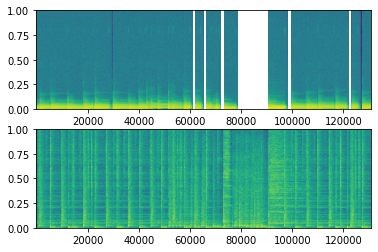

In [8]:
import torchaudio
from IPython.display import Audio
from misc import load_audio
import math
from audio_data_pytorch.transforms import Loudness
import matplotlib.pyplot as plt

sampling_rate = 22050

# Generation length in seconds (will be rounded to be a power of 2 of sample_rate*length)
length_samples = 262144 #2**math.ceil(math.log2(length * sampling_rate))

start, end = 170 * sampling_rate, 170 * sampling_rate + length_samples
s1 = load_audio('/data/MusDB/data/test_MusDB_reduced/Al James - Schoolboy Facination/bass.wav', sampling_rate, start, end)
s2 = load_audio('/data/MusDB/data/test_MusDB_reduced/Al James - Schoolboy Facination/drums.wav', sampling_rate, start, end)

# convert to mono
s1, s2 = s1.sum(dim=1, keepdims=True), s2.sum(dim=1, keepdims=True)
m = s1 + s2


def plot_waves(s1, s2):    
    fig = plt.figure()
    axes = fig.add_subplot(2,1,1)
    spec, _, _, img = plt.specgram(s1.reshape(-1), NFFT=1024,)

    axes = fig.add_subplot(2,1,2)
    spec, _, _, img = plt.specgram(s2.reshape(-1), NFFT=1024,)

    #plt.legend(["piano", "bass"])
    plt.show()
    
    display(Audio(s1.reshape(1,-1), rate = sampling_rate))
    display(Audio(s2.reshape(1,-1), rate = sampling_rate))
    display(Audio((s1+s2).reshape(1,-1), rate = sampling_rate))
    
plot_waves(s1, s2)

In [4]:
from misc import display_audio

def sdr(preds, targets):
    preds = preds.cpu()
    targets = targets.cpu()

    signal = torch.norm(targets) ** 2
    e_error = torch.norm(preds - targets) ** 2
    return 10 * torch.log10( signal/e_error )

spec = torchaudio.transforms.Spectrogram(n_fft=1024, win_length=256, hop_length=32, power=None)
invspec = torchaudio.transforms.InverseSpectrogram(n_fft=1024, win_length=256, hop_length=32)
ts_speedup = torchaudio.transforms.TimeStretch(1024/2, n_freq=513,fixed_rate=1.4)
ts_slowdown = torchaudio.transforms.TimeStretch(1024/2, n_freq=513, fixed_rate=1/1.4)


s1_hat = invspec(ts_slowdown(ts_speedup(spec(s1.squeeze(0)))))[:,:s1.shape[-1]]
display_audio(s1,sampling_rate)
display_audio(s1_hat, sampling_rate)
sdr(s1_hat,s1.squeeze(0))

tensor(-0.3961)

In [10]:
import torchmetrics.functional.audio as tma
from main.evaluate_separation import museval_sdr as msdr

def si_snr(preds, targets):
    return tma.scale_invariant_signal_distortion_ratio(preds.cpu(), targets.cpu()).item()

def sdr(preds, targets):
    preds = preds.cpu()
    targets = targets.cpu()

    signal = torch.norm(targets) ** 2
    e_error = torch.norm(preds - targets) ** 2
    return 10 * torch.log10( signal/e_error )


def museval_sdr(y1,y2,s1,s2):
    preds = torch.stack([y1,y2],dim=1)
    target = torch.stack([s1,s2], dim=1)
    museval_sdr(preds, target, sampling_rate)

    
def plot_separation(y1, y2, m):
    print("separation 1")
    display(Audio(y1.detach().cpu().view(1,-1), rate = sampling_rate))
    print("separation 2")
    display(Audio(y2.detach().cpu().view(1,-1), rate = sampling_rate))
    
    print("mixture of separations")
    display(Audio((y1+y2).detach().cpu().view(1,-1), rate = sampling_rate))
    
    print("mixture")
    display(Audio((m).detach().cpu().view(1,-1), rate = sampling_rate))

    print(f"SI-SNR (1): {si_snr(y1, s1)}")
    print(f"SI-SNR (2): {si_snr(y2, s2)}")
    print(f"SI-SNR - mistura: {si_snr(s1, m)}, {si_snr(s2, m)}")
    print(f"SI-SNRi(1): {si_snr(y1, s1) - si_snr(s1, m)}")
    print(f"SI-SNRi (2): {si_snr(y2, s2) - si_snr(s2, m)}")
    print(f"SI-SNR (mix): {si_snr(y1+y2, m)}")

    #plot_waves(y1.cpu(), y2.cpu())
    #plot_waves((s1.cpu()-y1.cpu()), (s2.cpu()-y2.cpu()))
    
def plot_error(preds, target, start=0, duration=1000, step=1):
    preds = preds.cpu()[0,0,:]
    target = target.cpu()[0,0,:]
    
    s_hat = preds
    s_target = torch.dot(s_hat, target) * target / target.norm()**2
    s_error = s_hat - s_target

    plt.figure(figsize=(20,10))
    plt.subplot(1, 2, 1)
    plt.plot(s_target[start:start+duration:step])
    plt.plot(s_hat[start:start+duration:step], "g--")
    plt.legend(["target", "preds"])
    
    plt.subplot(1, 2, 2)
    plt.plot(s_hat[start:start+duration:step], "g--")
    #plt.plot(s_error.abs()[start:start+duration:step], "y")
    e = s_error.abs()[start:start+duration:step]
    plt.fill_between(range(len(e)), e, -e, alpha=0.25, color="y")
    plt.legend(["preds","error"])


    print(10*torch.log10(s_target.norm()**2/s_error.norm()**2))
    #print(si_snr(m-y2, s1))
    print(s_error.norm()**2)

In [14]:
from main.separation import KarrasSeparator, AEulerSeparator, AEulerSeparatorSymmetric, ADPM2Extractor, ADPM2Separator, enforce_mixture_consistency
from audio_diffusion_pytorch.diffusion import KarrasSchedule

@torch.no_grad()
def separate(
    model1,
    model2,
    mixture, 
    device: torch.device = torch.device("cuda"), 
    num_steps:int = 100,
):
    
    batch, in_channels = 1, 1
    samples = mixture.shape[-1]

    m = mixture.to(device)
    models = [model1.model, model2.model]
    
    for model in models:
        model.to(device)
        
    sigma_sched = KarrasSchedule(sigma_min=1e-4, sigma_max=1.0, rho=9.0)
    diffusion_separator = ADPM2Extractor(mixture=m)

    sigma = sigma_sched(num_steps, device)
    fns = [model.diffusion.denoise_fn for model in models]
    noises = [torch.randn_like(m).to(device), torch.randn_like(m).to(device)]
    return diffusion_separator.forward(noises=noises, fns=fns, sigmas=sigma, num_steps=num_steps)

y1, y2 = separate(model_1, model_2, m, num_steps=300)
#y1, y2 = y1.cpu(), y2.cpu()
#y1, y2 = m-y2, m-y1

plot_separation(y1,y2,m)
print(sdr(y1,s1), sdr(y2,s2))


#plot_error(m-y2.cpu(), s1, start = 13000, duration = 2000, step=1)

separation 1


separation 2


mixture of separations


mixture


SI-SNR (1): 5.333654880523682
SI-SNR (2): 1.4065561294555664
SI-SNR - mistura: 2.78617262840271, -2.31524920463562
SI-SNRi(1): 2.5474822521209717
SI-SNRi (2): 3.7218053340911865
SI-SNR (mix): 106.43556213378906
tensor(6.3830) tensor(3.7651)


In [11]:

plot_separation(y1,y2,m)
print(sdr(y1,s1), sdr(y2,s2))

separation 1


separation 2


mixture of separations


mixture


SI-SNR (1): 4.450722694396973
SI-SNR (2): 0.32911744713783264
SI-SNR - mistura: 2.78617262840271, -2.31524920463562
SI-SNRi(1): 1.6645500659942627
SI-SNRi (2): 2.6443666517734528
SI-SNR (mix): 106.43571472167969
tensor(5.7609) tensor(3.1429)


In [25]:
import numpy as np
from misc import display_audio

def least_squares_normalization(y1,y2,m):
    y1np, y2np = y1.view(-1).cpu().numpy(), y2.view(-1).cpu().numpy()
    print(y1.shape)
    y = np.stack([y1np, y2np], axis=1)
    print(y.shape)
    a = np.linalg.lstsq(y, m.view(-1,1).cpu().numpy())
    a,_,_,_ = a
    a1, a2 = a.reshape(-1).tolist()
    return a1*y1, a2*y2

y1_normalized,y2_normalized = least_squares_normalization(y1,y2,m)

plot_separation(y1_normalized,y2_normalized,m)

#y1_n = y1/y1.norm()*s1.norm()
#y2_n = y2/y2.norm()*s2.norm()
#print((y1_n - y1_normalized).abs().max())
print()
print(sdr(y1/y1.norm()*s1.norm(), s1))
print(sdr(y2/y2.norm()*s2.norm(), s2))
print(sdr(y1_n+y2_n, s1+s2))
print()
print(si_snr(y1_normalized, s1))
print(si_snr(y2_normalized, s2))
print(sdr(y1_normalized+y2_normalized, s1+s2))
display_audio(y1_normalized, 22050)
display_audio(y2_normalized, 22050)
print()
y1_cons, y2_cons = enforce_mixture_consistency(m, torch.stack([y1_normalized,y2_normalized],dim=1))
print(sdr(y1_cons, s1))
print(sdr(y2_cons, s2))
print(sdr(y1_cons+y2_cons, s1+s2))
display_audio(y1_cons, 22050)
display_audio(y2_cons, 22050)

torch.Size([1, 1, 262144])
(262144, 2)
separation 1


<ipython-input-25-20c9924955ef>:9: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  a = np.linalg.lstsq(y, m.view(-1,1).cpu().numpy())


separation 2


mixture of separations


mixture


SI-SNR (1): 5.826505661010742
SI-SNR (2): -3.2966372966766357
SI-SNR - mistura: 2.78617262840271, -2.31524920463562
SI-SNRi(1): 3.0403330326080322
SI-SNRi (2): -0.9813880920410156
SI-SNR (mix): 4.01699161529541

tensor(6.5903)
tensor(0.6014)
tensor(3.8237)

5.826505661010742
-3.2966372966766357
tensor(5.4676)



tensor(6.4114)
tensor(3.7934)
tensor(148.3475)


In [17]:
(6.4114 + 3.7934 )/2

5.1024

In [64]:
torchaudio.save("y2.wav", y2.squeeze(0), 22050)
torchaudio.save("s2.wav", s2.squeeze(0), 22050)
torchaudio.save("y1.wav", y1.squeeze(0), 22050)
torchaudio.save("s1.wav", s1.squeeze(0), 22050)

In [51]:
y1, y2 = enforce_mixture_consistency(m, torch.stack([y1,y2],dim=1))

preds = torch.stack([y1,y2],dim=1)
target = torch.stack([s1,s2], dim=1)
sdr(y1, s1), sdr(y2,s2)

(tensor(4.3282), tensor(1.7103))

<ipython-input-5-447fef96d3e8>:82: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  m = torch.tensor(mixture).to(device)


likelihood norm: 728.3746337890625
prior 1 norm: 168.30923461914062
prior 2 norm: 168.48629760742188



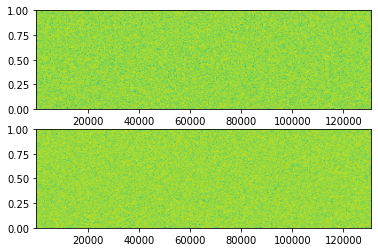

likelihood norm: 0.06682822853326797
prior 1 norm: 0.02706654742360115
prior 2 norm: 0.027033647522330284



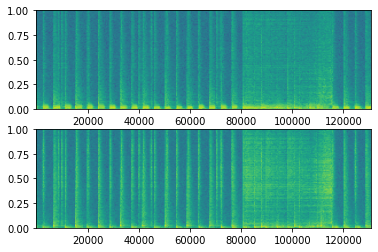

5.450437041881623

In [5]:
from typing import List, Optional

import torch
from torch import Tensor

from audio_diffusion_pytorch.diffusion import AEulerSampler, ADPM2Sampler, Diffusion, KarrasSchedule, Sampler, Schedule
from audio_diffusion_pytorch.model import AudioDiffusionModel
from audio_diffusion_pytorch.utils import default, exists

class DiffusionSeparator:
    def __init__(
        self,
        diffusions: List[Diffusion],
        *,
        samplers: List[Sampler],
        sigma_schedules: List[Schedule],
        num_steps: Optional[int] = None,
        nu = 0.2
    ):
        super().__init__()
        self.denoise_fns = [denoise_fn for denoise_fn in diffusions]
        self.samplers = samplers
        self.sigma_schedules = sigma_schedules
        self.num_steps = num_steps
        self.nu = nu

    def forward(self, m: Tensor, noises: List[Tensor], num_steps: Optional[int] = None) -> List[Tensor]:
        device = noises[0].device
        num_steps = default(num_steps, self.num_steps)
        assert exists(num_steps), "Parameter `num_steps` must be provided"
        
        # Compute sigmas using schedule
        sigmas_list = [sigma_schedule(num_steps, device) for sigma_schedule in self.sigma_schedules]
        
        # Append additional kwargs to denoise function (used e.g. for conditional unet)
        fns = self.denoise_fns
        
        # Separation procedure
        xs = [sigmas[0] * noise for sigmas, noise in zip(sigmas_list, noises)]
                

        @torch.no_grad()
        def perform_sample_step(xs:list, step:int):
            for j, x in enumerate(xs):
                    yield self.samplers[j].step(
                        x, fn=fns[j], sigma=sigmas_list[j][step], sigma_next=sigmas_list[j][step + 1])
                    
        # Denoise to sample
        for step in range(num_steps - 1):
            us = list(perform_sample_step(xs, step))
            g_x = torch.stack(xs).sum(dim=0)
            
            likelihood = self.nu*(m - g_x)
            
            if step % 100 == 0:
                likelihood_norm = torch.norm(m - g_x)
                print("likelihood norm:", likelihood_norm.item())
                print("prior 1 norm:", torch.norm(us[0] - xs[0]).item())
                print("prior 2 norm:", torch.norm(us[1] - xs[1]).item())
                print("")
                plot_waves(xs[0].cpu(), xs[1].cpu())
            
            for i in range(len(xs)):
                xs[i] = us[i] + likelihood
                
        xs = [x.clamp(-1.0, 1.0) for x in xs]
        return xs


@torch.no_grad()
def separate(
    model1,
    model2,
    mixture, 
    device: torch.device = torch.device("cuda"), 
    num_steps:int = 102,
):
    
    batch, in_channels = 1, 1
    samples = mixture.shape[-1]

    m = torch.tensor(mixture).to(device)
    models = [model1.model, model2.model]
    
    for model in models:
        model.to(device)
    
    
    schedule = KarrasSchedule(sigma_min=1e-4, sigma_max=1.0, rho=9.0)
    
    diffusion_separator = DiffusionSeparator(
        [model.diffusion.denoise_fn for model in models],
        samplers=[ADPM2Sampler(rho=1.0), ADPM2Sampler(rho=1.0)],
        sigma_schedules=[schedule, schedule],
        num_steps=num_steps
    )
    noises = [torch.randn_like(m).to(device), torch.randn_like(m).to(device)]
    return diffusion_separator.forward(m, noises)


y1, y2 = separate(model_1, model_2, m)

preds = torch.stack([y1,y2],dim=1)
target = torch.stack([s1,s2], dim=1)
museval_sdr(preds, target, sampling_rate)

#plot_separation(y1, y2, m)
#plot_error(preds=y1.cpu(), target=s1, start = 13000, duration = 2000, step=1)

# Norm of score model 

In [61]:
@torch.no_grad()
def compute_norm(
    noise: Tensor, 
    denoise_fn,
    sampler,
    sigmas: torch.Tensor, 
    num_steps: int = 10,
) -> List[Tensor]:

    device = noise.device
    assert exists(num_steps), "Parameter `num_steps` must be provided"        
    
    # Separation procedure
    x = sigmas[0] * noise

    # Denoise to sample
    grad_norms = []
    for step in range(num_steps - 1):
        grad_log_p = (x - denoise_fn(x, sigma=sigmas[step])) / sigmas[step]**2
        grad_norms += [grad_log_p.norm().cpu()]
        x = sampler.step(x, fn=denoise_fn, sigma=sigmas[step], sigma_next=sigmas[step + 1])
                
    return x.clamp(-1.0, 1.0), torch.stack(grad_norms)


@torch.no_grad()
def compute_score_norm(model, device: torch.device = torch.device("cuda"), num_steps:int = 100):
    
    model.to(device)
    noise = torch.randn((num_samples, 1, length_samples)).to(device)
    schedule = KarrasSchedule(sigma_min=1e-4, sigma_max=1.0, rho=9.0)
    sigmas = schedule(num_steps, device)
    x, norms = compute_norm(
        noise = noise,
        denoise_fn = model.model.diffusion.denoise_fn,
        sampler = ADPM2Sampler(rho=1.0),
        sigmas = sigmas,
        num_steps = num_steps
    )
    return norms.cpu(), sigmas[:-2].cpu()


grads, sigmas = compute_score_norm(model_2)
#print(grads, sigmas)

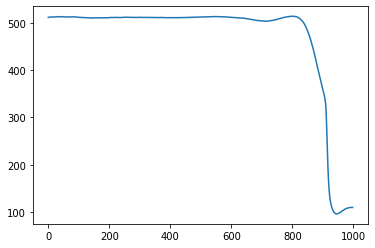

In [60]:
import matplotlib.pyplot as plt
plt.plot(grads*sigmas)

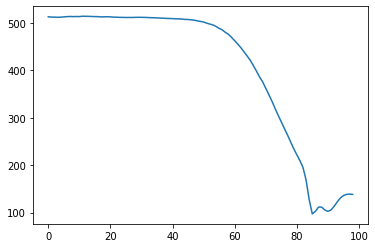

In [62]:
plt.plot(grads*sigmas)

In [ ]:
torchaudio.save("s1.wav", s1.reshape(1,-1).cpu(), 22050)
torchaudio.save("s2.wav", s2.reshape(1,-1).cpu(), 22050)
torchaudio.save("m.wav", m.reshape(1,-1).cpu(), 22050)

# Data Separation

In [16]:
from audio_data_pytorch import WAVDataset, AllTransform
from main.dataset import UnionSeparationDataset
from main.evaluate_separation import evaluate_data
from main.separation import separate_dataset
from main.separation import KarrasSeparator, AEulerSeparator, AEulerSeparatorSymmetric, ADPM2Extractor, ADPM2Separator

dataset_1 = WAVDataset(
    "/data/MusDB/data/bass/test",
    transforms=AllTransform(source_rate=44100, target_rate=22050,random_crop_size=262144, mono=True),
)

dataset_2 = WAVDataset(
    "/data/MusDB/data/drums/test",
    transforms=AllTransform(source_rate=44100, target_rate=22050, random_crop_size=262144, mono=True),
)

dataset = UnionSeparationDataset([dataset_1, dataset_2], 22050)

separate_dataset(
    dataset,
    denoise_fns=[model_1.model.diffusion.denoise_fn, model_2.model.diffusion.denoise_fn],
    save_path='separations-musdb-irene-2',
    separator=ADPM2Extractor,
    separation_steps=50,
    device=model_1.device,
)

  0%|          | 0/50 [00:00<?, ?it/s]

chunk 1 out of 50


/home/giorgio/audio-diffusion-pytorch-trainer/main/separation.py:256: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  a = np.linalg.lstsq(y, m.view(-1,1).cpu().numpy())
  2%|▏         | 1/50 [00:15<12:23, 15.17s/it]

chunk 2 out of 50


  4%|▍         | 2/50 [00:28<11:24, 14.26s/it]

chunk 3 out of 50


  6%|▌         | 3/50 [00:42<10:55, 13.95s/it]

chunk 4 out of 50


  8%|▊         | 4/50 [00:55<10:35, 13.82s/it]

chunk 5 out of 50


 10%|█         | 5/50 [01:09<10:19, 13.76s/it]

chunk 6 out of 50


 12%|█▏        | 6/50 [01:23<10:04, 13.75s/it]

chunk 7 out of 50


 14%|█▍        | 7/50 [01:37<09:50, 13.74s/it]

chunk 8 out of 50


 16%|█▌        | 8/50 [01:50<09:37, 13.75s/it]

chunk 9 out of 50


 18%|█▊        | 9/50 [02:04<09:24, 13.76s/it]

chunk 10 out of 50


 20%|██        | 10/50 [02:18<09:10, 13.77s/it]

chunk 11 out of 50


 22%|██▏       | 11/50 [02:32<08:57, 13.78s/it]

chunk 12 out of 50


 24%|██▍       | 12/50 [02:46<08:43, 13.79s/it]

chunk 13 out of 50


 26%|██▌       | 13/50 [02:59<08:30, 13.79s/it]

chunk 14 out of 50


 28%|██▊       | 14/50 [03:13<08:16, 13.79s/it]

chunk 15 out of 50


 30%|███       | 15/50 [03:27<08:02, 13.80s/it]

chunk 16 out of 50


 32%|███▏      | 16/50 [03:41<07:49, 13.80s/it]

chunk 17 out of 50


 34%|███▍      | 17/50 [03:55<07:35, 13.80s/it]

chunk 18 out of 50


 36%|███▌      | 18/50 [04:08<07:21, 13.80s/it]

chunk 19 out of 50


 38%|███▊      | 19/50 [04:22<07:08, 13.82s/it]

chunk 20 out of 50


 40%|████      | 20/50 [04:36<06:55, 13.84s/it]

chunk 21 out of 50


 42%|████▏     | 21/50 [04:50<06:41, 13.85s/it]

chunk 22 out of 50


 44%|████▍     | 22/50 [05:04<06:28, 13.86s/it]

chunk 23 out of 50


 46%|████▌     | 23/50 [05:18<06:14, 13.87s/it]

chunk 24 out of 50


 48%|████▊     | 24/50 [05:32<06:00, 13.88s/it]

chunk 25 out of 50


 50%|█████     | 25/50 [05:46<05:47, 13.88s/it]

chunk 26 out of 50


 52%|█████▏    | 26/50 [05:59<05:33, 13.88s/it]

chunk 27 out of 50


 54%|█████▍    | 27/50 [06:13<05:19, 13.89s/it]

chunk 28 out of 50


 56%|█████▌    | 28/50 [06:27<05:05, 13.89s/it]

chunk 29 out of 50


 58%|█████▊    | 29/50 [06:41<04:51, 13.89s/it]

chunk 30 out of 50


 60%|██████    | 30/50 [06:55<04:37, 13.89s/it]

chunk 31 out of 50


 62%|██████▏   | 31/50 [07:09<04:23, 13.89s/it]

chunk 32 out of 50


 64%|██████▍   | 32/50 [07:23<04:10, 13.89s/it]

chunk 33 out of 50


 66%|██████▌   | 33/50 [07:37<03:56, 13.89s/it]

chunk 34 out of 50


 68%|██████▊   | 34/50 [07:51<03:42, 13.89s/it]

chunk 35 out of 50


 70%|███████   | 35/50 [08:04<03:28, 13.89s/it]

chunk 36 out of 50


 72%|███████▏  | 36/50 [08:18<03:14, 13.89s/it]

chunk 37 out of 50


 74%|███████▍  | 37/50 [08:32<03:00, 13.90s/it]

chunk 38 out of 50


 76%|███████▌  | 38/50 [08:46<02:46, 13.89s/it]

chunk 39 out of 50


 78%|███████▊  | 39/50 [09:00<02:32, 13.89s/it]

chunk 40 out of 50


 80%|████████  | 40/50 [09:14<02:18, 13.89s/it]

chunk 41 out of 50


 82%|████████▏ | 41/50 [09:28<02:05, 13.89s/it]

chunk 42 out of 50


 84%|████████▍ | 42/50 [09:42<01:51, 13.89s/it]

chunk 43 out of 50


 86%|████████▌ | 43/50 [09:56<01:37, 13.89s/it]

chunk 44 out of 50


 88%|████████▊ | 44/50 [10:10<01:23, 13.89s/it]

chunk 45 out of 50


 90%|█████████ | 45/50 [10:23<01:09, 13.89s/it]

chunk 46 out of 50


 92%|█████████▏| 46/50 [10:37<00:55, 13.89s/it]

chunk 47 out of 50


 94%|█████████▍| 47/50 [10:51<00:41, 13.89s/it]

chunk 48 out of 50


 96%|█████████▌| 48/50 [11:05<00:27, 13.89s/it]

chunk 49 out of 50


 98%|█████████▊| 49/50 [11:19<00:13, 13.89s/it]

chunk 50 out of 50


100%|██████████| 50/50 [11:33<00:00, 13.87s/it]


In [7]:
print(len(dataset_2))

50


In [24]:
from pathlib import Path
import tqdm

output_folder = Path("separations")
output_folder.mkdir(exist_ok=True)
for i in tqdm.autonotebook.tqdm(range(min(len(dataset_1), len(dataset_2)))):
    x1, x2 = dataset_1[i], dataset_2[i]
    x1 ,x2 = x1.unsqueeze(0), x2.unsqueeze(0)
    
    assert len(x1.shape) == len(x2.shape) == 3
    assert x1.shape[0:2] == x2.shape[0:2] == (1,1)
    assert x1.shape == x2.shape
    
    y1, y2 = separate(model_1, model_2, x1 + x2)
    
    separation_folder = (output_folder / f"{i}" )
    separation_folder.mkdir(exist_ok=True)
    
    torchaudio.save(separation_folder/ "ori1.wav", x1.reshape(1,-1).cpu(), 22050)
    torchaudio.save(separation_folder/"ori2.wav", x2.reshape(1,-1).cpu(), 22050)
    torchaudio.save(separation_folder /"sep1.wav", y1.reshape(1,-1).cpu(), 22050)
    torchaudio.save(separation_folder /"sep2.wav", y2.reshape(1,-1).cpu(), 22050)
    torchaudio.save(separation_folder /"mix.wav", m.reshape(1,-1).cpu(), 22050)


  0%|          | 0/50 [00:00<?, ?it/s]

<ipython-input-18-1dece1235b38>:87: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  m = torch.tensor(mixture).to(device)


KeyboardInterrupt: 

# Other stuff

In [ ]:
from audio_diffusion_pytorch.diffusion import AEulerSampler, ADPM2Sampler, Diffusion, KarrasSchedule, Sampler, Schedule

with torch.no_grad():
     samples = model_1.model.sample(
         noise=torch.randn((num_samples, 2, length_samples), device=DEVICE),
         num_steps=100,
         sigma_schedule=KarrasSchedule(sigma_min=1e-4, sigma_max=3.0, rho=7.0),
         sampler=ADPM2Sampler(),
     )

# Log audio samples
for i, sample in enumerate(samples):
     display(Audio(sample.cpu(), rate = sampling_rate))

In [ ]:
k = KarrasSchedule(sigma_min=1e-4, sigma_max=3.0, rho=9.0)
sigmas_rev = k(num_steps=99, device="cpu")

#step_size = torch.tensor([3e-1]*100)

import matplotlib.pyplot as plt
#plt.plot(sigmas)
plt.plot(compute_likelihood_steps(sigmas_rev, gamma=0.0128))
#plt.plot(step_size)

In [ ]:
from audio_diffusion_pytorch.diffusion import KarrasSchedule
import matplotlib.pyplot as plt
import numpy as np

def plot_wave(s1):    
    fig = plt.figure()
    axes = fig.add_subplot(2,1,1)
    spec, _, _, img = plt.specgram(s1.reshape(-1), NFFT=1024,)
    plt.show()
    
    display(Audio(s1.reshape(1,-1), rate = sampling_rate))

k = KarrasSchedule(sigma_min=1e-4, sigma_max=3.0, rho=9.0)
sigmas = k(num_steps=10, device="cpu")

plt.plot(sigmas)
noise = torch.randn_like(s1).cpu()

for sigma in sigmas:
    print(f"({sigma}) SI-SNR : {si_snr(sigma*noise + s1, s1)}")
    #plot_wave(sigma*noise + s1)
    print("-----------------------\n")

In [ ]:
x=np.arange(100)/1000
y=10*np.log10(np.linalg.norm(s1)**2 / (s1.numel()*x**2))
#plt.plot(x,y)
import plotly.express as px
px.line(y)

In [ ]:
import math
from IPython.display import Audio
from audio_diffusion_pytorch.diffusion import ADPM2Sampler, KarrasSchedule
sampling_rate=22050

device="cuda"
with torch.no_grad():
    
    model = model_2.model
    model.to(device)
        
    samples = model.sample(
         noise=torch.randn((1, 1, 2**math.ceil(math.log2(10 * sampling_rate))), device='cuda'),
         num_steps=100,
         sigma_schedule=KarrasSchedule(
             sigma_min=1e-4,
             sigma_max=1.0,
             rho=9.0
         ),
         sampler=ADPM2Sampler(rho=1.0),
     )

# Log audio samples
for i, sample in enumerate(samples):
    display(Audio(sample.cpu(), rate = sampling_rate))